<pre>
Name: Ritika Sarkar 
Reg. No.: 19BAI1031 
Faculty: Dr. G. Suganya 
Slot: L3 + L4 
Course Code: CSE1015 
Date: 08.04.2021
</pre>

## ML Digital Assignment 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt 
import numpy as np

Link to dataset : https://www.kaggle.com/dipam7/student-grade-prediction

Importing the dataset

In [2]:
import os
#using the kaggle api 
os.environ['KAGGLE_USERNAME'] = "ritikasarkar" # username from the json file
os.environ['KAGGLE_KEY'] = "cd58ec3b11ab3fad030cca0b1facf534" # key from the json file


In [4]:
!kaggle datasets download -d dipam7/student-grade-prediction 

student-grade-prediction.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
# ran the notebook again so its not downloaded again

In [5]:
data = pd.read_csv('student-grade-prediction.zip')

In [6]:
data.head()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,...,4,3,4,1,1,3,6,5,6,6
1,GP,F,17,U,GT3,T,1,1,at_home,other,...,5,3,3,1,1,3,4,5,5,6
2,GP,F,15,U,LE3,T,1,1,at_home,other,...,4,3,2,2,3,3,10,7,8,10
3,GP,F,15,U,GT3,T,4,2,health,services,...,3,2,2,1,1,5,2,15,14,15
4,GP,F,16,U,GT3,T,3,3,other,other,...,4,3,2,1,2,5,4,6,10,10


<pre>
DATASET DETAILS
# Attributes for both student-mat.csv (Math course) and student-por.csv (Portuguese language course) datasets:
1 school - student's school (binary: 'GP' - Gabriel Pereira or 'MS' - Mousinho da Silveira)
2 sex - student's sex (binary: 'F' - female or 'M' - male)
3 age - student's age (numeric: from 15 to 22)
4 address - student's home address type (binary: 'U' - urban or 'R' - rural)
5 famsize - family size (binary: 'LE3' - less or equal to 3 or 'GT3' - greater than 3)
6 Pstatus - parent's cohabitation status (binary: 'T' - living together or 'A' - apart)
7 Medu - mother's education (numeric: 0 - none, 1 - primary education (4th grade), 2 â€“ 5th to 9th grade, 3 â€“ secondary education or 4 â€“ higher education)
8 Fedu - father's education (numeric: 0 - none, 1 - primary education (4th grade), 2 â€“ 5th to 9th grade, 3 â€“ secondary education or 4 â€“ higher education)
9 Mjob - mother's job (nominal: 'teacher', 'health' care related, civil 'services' (e.g. administrative or police), 'at_home' or 'other')
10 Fjob - father's job (nominal: 'teacher', 'health' care related, civil 'services' (e.g. administrative or police), 'at_home' or 'other')
11 reason - reason to choose this school (nominal: close to 'home', school 'reputation', 'course' preference or 'other')
12 guardian - student's guardian (nominal: 'mother', 'father' or 'other')
13 traveltime - home to school travel time (numeric: 1 - <15 min., 2 - 15 to 30 min., 3 - 30 min. to 1 hour, or 4 - >1 hour)
14 studytime - weekly study time (numeric: 1 - <2 hours, 2 - 2 to 5 hours, 3 - 5 to 10 hours, or 4 - >10 hours)
15 failures - number of past class failures (numeric: n if 1<=n<3, else 4)
16 schoolsup - extra educational support (binary: yes or no)
17 famsup - family educational support (binary: yes or no)
18 paid - extra paid classes within the course subject (Math or Portuguese) (binary: yes or no)
19 activities - extra-curricular activities (binary: yes or no)
20 nursery - attended nursery school (binary: yes or no)
21 higher - wants to take higher education (binary: yes or no)
22 internet - Internet access at home (binary: yes or no)
23 romantic - with a romantic relationship (binary: yes or no)
24 famrel - quality of family relationships (numeric: from 1 - very bad to 5 - excellent)
25 freetime - free time after school (numeric: from 1 - very low to 5 - very high)
26 goout - going out with friends (numeric: from 1 - very low to 5 - very high)
27 Dalc - workday alcohol consumption (numeric: from 1 - very low to 5 - very high)
28 Walc - weekend alcohol consumption (numeric: from 1 - very low to 5 - very high)
29 health - current health status (numeric: from 1 - very bad to 5 - very good)
30 absences - number of school absences (numeric: from 0 to 93)

# these grades are related with the course subject, Math or Portuguese:
31 G1 - first period grade (numeric: from 0 to 20)
31 G2 - second period grade (numeric: from 0 to 20)
32 G3 - final grade (numeric: from 0 to 20, output target)
</pre>

Exploratory data analysis

In [7]:
data.columns

Index(['school', 'sex', 'age', 'address', 'famsize', 'Pstatus', 'Medu', 'Fedu',
       'Mjob', 'Fjob', 'reason', 'guardian', 'traveltime', 'studytime',
       'failures', 'schoolsup', 'famsup', 'paid', 'activities', 'nursery',
       'higher', 'internet', 'romantic', 'famrel', 'freetime', 'goout', 'Dalc',
       'Walc', 'health', 'absences', 'G1', 'G2', 'G3'],
      dtype='object')

In [8]:
data.shape # shape of dataset

(395, 33)

In [9]:
data.describe()

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
count,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000
mean,16.696203,2.749367,2.521519,1.448101,2.035443,0.334177,3.944304,3.235443,3.108861,1.481013,2.291139,3.554430,5.708861,10.908861,10.713924,10.415190
std,1.276043,1.094735,1.088201,0.697505,0.839240,0.743651,0.896659,0.998862,1.113278,0.890741,1.287897,1.390303,8.003096,3.319195,3.761505,4.581443
min,15.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,3.000000,0.000000,0.000000
25%,16.000000,2.000000,2.000000,1.000000,1.000000,0.000000,4.000000,3.000000,2.000000,1.000000,1.000000,3.000000,0.000000,8.000000,9.000000,8.000000
50%,17.000000,3.000000,2.000000,1.000000,2.000000,0.000000,4.000000,3.000000,3.000000,1.000000,2.000000,4.000000,4.000000,11.000000,11.000000,11.000000
75%,18.000000,4.000000,3.000000,2.000000,2.000000,0.000000,5.000000,4.000000,4.000000,2.000000,3.000000,5.000000,8.000000,13.000000,13.000000,14.000000
max,22.000000,4.000000,4.000000,4.000000,4.000000,3.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,75.000000,19.000000,19.000000,20.000000


In [10]:
data.isnull().sum() #  checking for missing values

school        0
sex           0
age           0
address       0
famsize       0
Pstatus       0
Medu          0
Fedu          0
Mjob          0
Fjob          0
reason        0
guardian      0
traveltime    0
studytime     0
failures      0
schoolsup     0
famsup        0
paid          0
activities    0
nursery       0
higher        0
internet      0
romantic      0
famrel        0
freetime      0
goout         0
Dalc          0
Walc          0
health        0
absences      0
G1            0
G2            0
G3            0
dtype: int64

Checking correlation

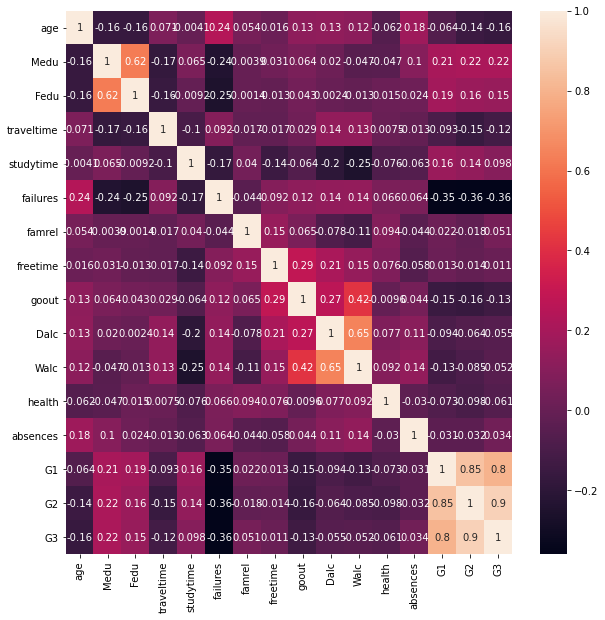

In [11]:
import seaborn as sns 
plt.figure(figsize=(10,10))
sns.heatmap(data.corr(),annot=True) # G1,G2 are highly correlated to G3

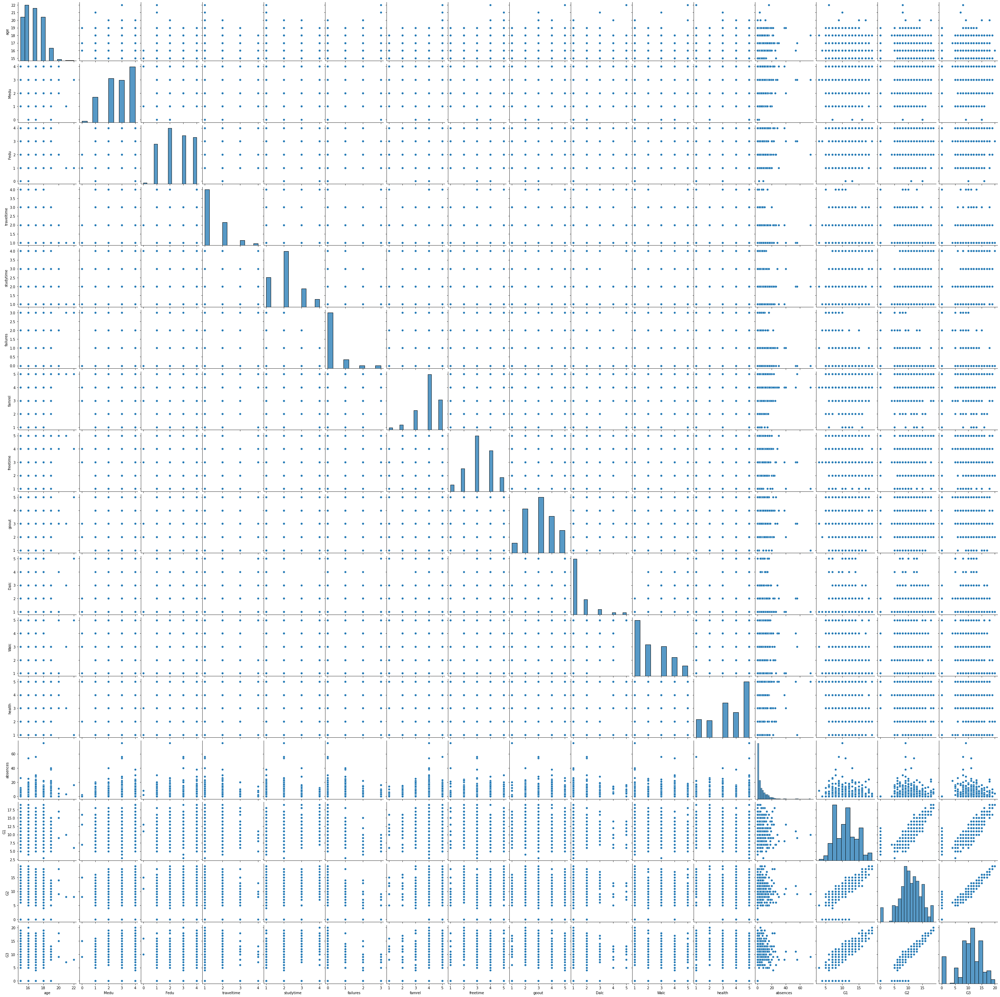

In [12]:
sns.pairplot(data) # mostly the data is categorical or not correlated. We can see that 'absences; don't affect the 'G3' that much

In [13]:
for i in range(data.shape[1]):
    print(data.iloc[:,i].value_counts()) # finding counts of the data points present in each column

GP    349
MS     46
Name: school, dtype: int64
F    208
M    187
Name: sex, dtype: int64
16    104
17     98
18     82
15     82
19     24
20      3
22      1
21      1
Name: age, dtype: int64
U    307
R     88
Name: address, dtype: int64
GT3    281
LE3    114
Name: famsize, dtype: int64
T    354
A     41
Name: Pstatus, dtype: int64
4    131
2    103
3     99
1     59
0      3
Name: Medu, dtype: int64
2    115
3    100
4     96
1     82
0      2
Name: Fedu, dtype: int64
other       141
services    103
at_home      59
teacher      58
health       34
Name: Mjob, dtype: int64
other       217
services    111
teacher      29
at_home      20
health       18
Name: Fjob, dtype: int64
course        145
home          109
reputation    105
other          36
Name: reason, dtype: int64
mother    273
father     90
other      32
Name: guardian, dtype: int64
1    257
2    107
3     23
4      8
Name: traveltime, dtype: int64
2    198
1    105
3     65
4     27
Name: studytime, dtype: int64
0    312
1  

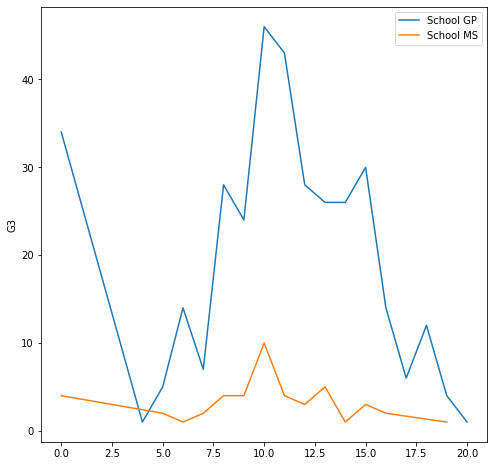

In [14]:
# we observe there are 2 schools here, let's compare their grades using graph
plt.figure(figsize=(8,8))
sns.lineplot(data = data[data['school']=='GP']['G3'].value_counts(), label="School GP")
sns.lineplot(data = data[data['school']=='MS']['G3'].value_counts(), label="School MS")
# we conclude that either the data about MS is lesser or GP performs better than MS

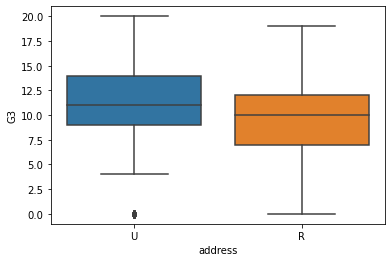

In [15]:
# compare urban and rural
sns.boxplot(x="address",y="G3",data=data)
# students from urban areas perform better than rural areas

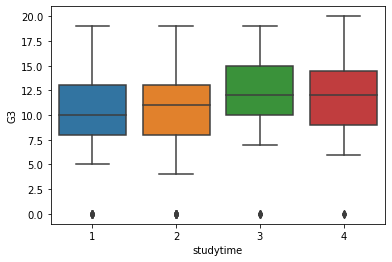

In [16]:
# compare studytime
sns.boxplot(x="studytime",y="G3",data=data)
# students studying for 3 hours and more perform better. The highest scorer studied 4 hours.

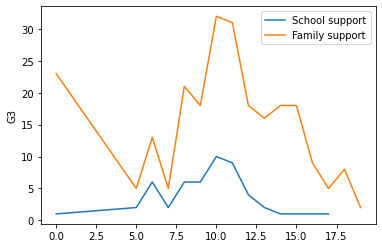

In [17]:
# comparing the family support and school support received by the students
sns.lineplot(data = data[data['schoolsup']=='yes']['G3'].value_counts(), label="School support")
sns.lineplot(data = data[data['famsup']=='yes']['G3'].value_counts(), label="Family support")
# we observe students who received family support performed better than when they received only school support. Since family support means support on all levels like mental well-being, health, as well as studies

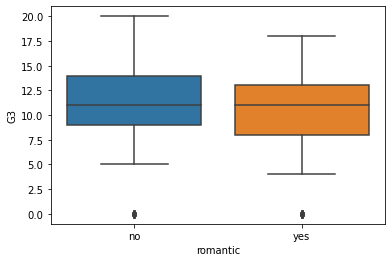

In [18]:
# this compares the performance of students who engaged in relationships and those who didn't
sns.boxplot(x="romantic",y="G3",data=data)
# we conclude that those who did not engage in relationships performed somewhat better than those who did

We drew many meaningful insights from the dataset
Now since there are many categorical string values we'll convert them to numeric values for the modelling

In [19]:
# from sklearn.preprocessing import LabelEncoder
# encoder = LabelEncoder()
# # columns having categorical values - school, sex, address, famsize, Pstatus, Mjob, Fjob, reason, guardian, schoolsup, famsup, paid, activities, nursery, higher, internet, romantic

In [20]:
# list = ["school", "sex", "address", "famsize", "Pstatus", "Mjob", "Fjob", "reason", "guardian", "schoolsup", "famsup", "paid", "activities", "nursery", "higher", "internet", "romantic"]
# for i in list:
#     data[i] = encoder.fit_transform(data[i])

In [21]:
data.head()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,...,4,3,4,1,1,3,6,5,6,6
1,GP,F,17,U,GT3,T,1,1,at_home,other,...,5,3,3,1,1,3,4,5,5,6
2,GP,F,15,U,LE3,T,1,1,at_home,other,...,4,3,2,2,3,3,10,7,8,10
3,GP,F,15,U,GT3,T,4,2,health,services,...,3,2,2,1,1,5,2,15,14,15
4,GP,F,16,U,GT3,T,3,3,other,other,...,4,3,2,1,2,5,4,6,10,10


In [22]:
data.columns[0]

'school'

One Hot Encoding (for categorical features)

In [23]:
olist = ["school", "sex", "address", "famsize","Pstatus", "Mjob", "Fjob", "reason", "guardian", "schoolsup", "famsup", "paid", "activities", "nursery", "higher", "internet", "romantic"]
olistn = []
for i in range(data.shape[1]):
    for j in olist:
        if data.columns[i] == j:
            olistn.append(i)

In [24]:
olistn

[0, 1, 3, 4, 5, 8, 9, 10, 11, 15, 16, 17, 18, 19, 20, 21, 22]

In [25]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder()
ct= ColumnTransformer([('encoder', ohe, olistn)], remainder='passthrough')

In [27]:
df = np.array(ct.fit_transform(data.drop('G3',axis=1)), dtype = np.str)

In [63]:
# for i in range(data.shape[1]):
#     print(data.iloc[:,i].value_counts()) # checking if all the values got converted

In [28]:
df

array([['1.0', '0.0', '1.0', ..., '6.0', '5.0', '6.0'],
       ['1.0', '0.0', '1.0', ..., '4.0', '5.0', '5.0'],
       ['1.0', '0.0', '1.0', ..., '10.0', '7.0', '8.0'],
       ...,
       ['0.0', '1.0', '0.0', ..., '3.0', '10.0', '8.0'],
       ['0.0', '1.0', '0.0', ..., '0.0', '11.0', '12.0'],
       ['0.0', '1.0', '0.0', ..., '5.0', '8.0', '9.0']], dtype='<U32')

In [29]:
# keep a copy of the dataset
data_copy = data
data = pd.DataFrame(df)

In [30]:
data_copy

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,...,4,3,4,1,1,3,6,5,6,6
1,GP,F,17,U,GT3,T,1,1,at_home,other,...,5,3,3,1,1,3,4,5,5,6
2,GP,F,15,U,LE3,T,1,1,at_home,other,...,4,3,2,2,3,3,10,7,8,10
3,GP,F,15,U,GT3,T,4,2,health,services,...,3,2,2,1,1,5,2,15,14,15
4,GP,F,16,U,GT3,T,3,3,other,other,...,4,3,2,1,2,5,4,6,10,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,MS,M,20,U,LE3,A,2,2,services,services,...,5,5,4,4,5,4,11,9,9,9
391,MS,M,17,U,LE3,T,3,1,services,services,...,2,4,5,3,4,2,3,14,16,16
392,MS,M,21,R,GT3,T,1,1,other,other,...,5,5,3,3,3,3,3,10,8,7
393,MS,M,18,R,LE3,T,3,2,services,other,...,4,4,1,3,4,5,0,11,12,10


In [31]:
data.head()

,0,1,2,3,4,5,6,7,8,9,...,48,49,50,51,52,53,54,55,56,57
0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,...,0.0,4.0,3.0,4.0,1.0,1.0,3.0,6.0,5.0,6.0
1,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,...,0.0,5.0,3.0,3.0,1.0,1.0,3.0,4.0,5.0,5.0
2,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,...,3.0,4.0,3.0,2.0,2.0,3.0,3.0,10.0,7.0,8.0
3,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,...,0.0,3.0,2.0,2.0,1.0,1.0,5.0,2.0,15.0,14.0
4,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,...,0.0,4.0,3.0,2.0,1.0,2.0,5.0,4.0,6.0,10.0


Splitting the dataset

In [32]:
# 1. feeding the entire dataset except target as the training set
x = data
y = data_copy['G3']
x.apply(pd.to_numeric)
y.apply(pd.to_numeric)

0       6
1       6
2      10
3      15
4      10
       ..
390     9
391    16
392     7
393    10
394     9
Name: G3, Length: 395, dtype: int64

Modelling - Regression

Using 
- Linear Regression
- Perceptron
- Decision Tree Regressor

First model taking the entire dataset as training set

1. Linear Regression

In [33]:
# using the regression algorithms since the target = 'G3' has continuous values
from sklearn.linear_model import LinearRegression, Perceptron
lr = LinearRegression()
lr.fit(x,y)

LinearRegression()

In [34]:
pred = lr.predict(x)

In [35]:
lr.coef_

array([-0.24037084,  0.24037084, -0.0871979 ,  0.0871979 , -0.05222747,
        0.05222747, -0.0182561 ,  0.0182561 ,  0.06383653, -0.06383653,
        0.01033152, -0.13609423,  0.08441972,  0.05728777, -0.01594477,
        0.03742774,  0.36837604, -0.04615394, -0.28471379, -0.07493605,
       -0.05686915, -0.26605261,  0.25068455,  0.07223721, -0.06743532,
        0.12830543, -0.06087011, -0.22822406,  0.22822406, -0.08843506,
        0.08843506, -0.03788214,  0.03788214,  0.17302341, -0.17302341,
        0.11135783, -0.11135783, -0.11296044,  0.11296044,  0.07223124,
       -0.07223124,  0.13600411, -0.13600411, -0.17330196,  0.1296851 ,
       -0.13393978,  0.0969944 , -0.10475355, -0.16053915,  0.35687576,
        0.04700155,  0.01200662, -0.18501947,  0.17677204,  0.062995  ,
        0.04587908,  0.18884682,  0.95732993])

In [36]:
lr.intercept_

-0.7298419705696251

In [37]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
print("MAE: ", mean_absolute_error(y,pred))
print("MSE: ",mean_squared_error(y,pred))
print("RMSE: ",np.sqrt(mean_squared_error(y,pred)))
print("R2 Score: ",r2_score(y,pred))

MAE:  1.1847494676713781
MSE:  3.2291325973085345
RMSE:  1.7969787414737366
R2 Score:  0.8457652439207497


C:\Users\RITIKA SARKAR\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


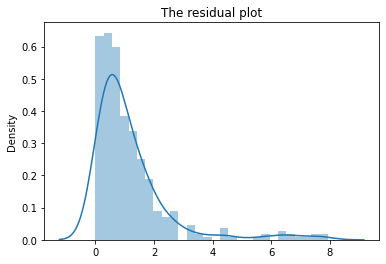

In [38]:
resid = [abs(y[i]-pred[i]) for i in range(len(y))]
# xaxis = [i for i in range(len(y))]
# fig, axs = plt.subplots(1, 1,
#                         figsize =(7, 5), 
#                         tight_layout = True)
  
# axs.hist(resid, bins = 20)
sns.distplot(resid)
plt.title("The residual plot")
plt.show()

2. Single Layer Perceptron

In [39]:
slp = Perceptron()
slp.fit(x,y)

Perceptron()

In [40]:
spred = slp.predict(x)

In [41]:
spred.dtype

dtype('int64')

C:\Users\RITIKA SARKAR\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


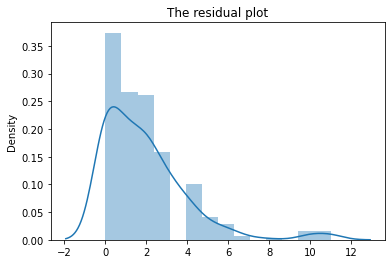

In [44]:
resid = [abs(y[i]-spred[i]) for i in range(len(y))]
sns.distplot(resid)
plt.title("The residual plot")
plt.show()

In [45]:
slp.coef_

array([[  17.,  -14.,    4., ..., -148.,  -39.,  -86.],
       [   1.,   -1.,    7., ...,  -20.,  -40.,  -32.],
       [ -17.,   20.,   13., ...,   -8., -100.,  -39.],
       ...,
       [  -5.,   -7.,   -2., ...,   10.,   38.,   96.],
       [ -11.,    5.,   -2., ...,  -31.,   46.,   62.],
       [  -3.,   -1.,   -9., ...,  -24.,   26.,   17.]])

In [46]:
slp.intercept_

array([  3.,   0.,   3.,   5.,   0.,  -1.,  -4.,   7.,   1.,  -1.,  -7.,
        -5.,  -6.,  -8.,  -5., -12.,  -6.,  -4.])

In [47]:
print("MAE: ", mean_absolute_error(y,spred))
print("MSE: ",mean_squared_error(y,spred))
print("RMSE: ",np.sqrt(mean_squared_error(y,spred)))
print("R2 Score: ",r2_score(y,spred))

MAE:  1.929113924050633
MSE:  8.253164556962025
RMSE:  2.872832149110356
R2 Score:  0.6057997669758348


Decision Tree Regressor

In [48]:
from sklearn.tree import DecisionTreeRegressor
dtr = DecisionTreeRegressor()
dtr.fit(x,y)

DecisionTreeRegressor()

In [49]:
dpred = dtr.predict(x)
print("MAE: ", mean_absolute_error(y,dpred))
print("MSE: ",mean_squared_error(y,dpred))
print("RMSE: ",np.sqrt(mean_squared_error(y,dpred)))
print("R2 Score: ",r2_score(y,dpred))

MAE:  0.0
MSE:  0.0
RMSE:  0.0
R2 Score:  1.0


C:\Users\RITIKA SARKAR\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\RITIKA SARKAR\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


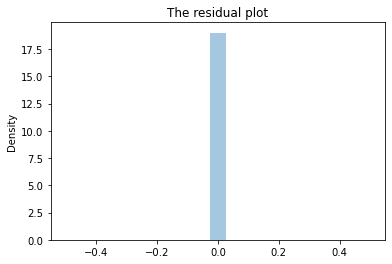

In [50]:
resid = [abs(y[i]-dpred[i]) for i in range(len(y))]
sns.distplot(resid)
plt.title("The residual plot")
plt.show()

In [ ]:
# the decision tree model is overfitted. We'll use train-test-split to check whether it works with new values

 8.5'),
 Text(102.48979591836735, 63.41999999999999, 'mse = 0.0\nsamples = 1\nvalue = 8.0'),
 Text(105.9061224489796, 63.41999999999999, 'mse = 0.0\nsamples = 1\nvalue = 9.0'),
 Text(116.79566326530613, 117.77999999999999, 'X[56] <= 7.5\nmse = 0.763\nsamples = 39\nvalue = 9.179'),
 Text(109.32244897959184, 99.66, 'X[12] <= 0.5\nmse = 0.16\nsamples = 5\nvalue = 7.8'),
 Text(107.61428571428571, 81.53999999999999, 'mse = 0.0\nsamples = 4\nvalue = 8.0'),
 Text(111.03061224489797, 81.53999999999999, 'mse = 0.0\nsamples = 1\nvalue = 7.0'),
 Text(124.26887755102041, 99.66, 'X[17] <= 0.5\nmse = 0.53\nsamples = 34\nvalue = 9.382'),
 Text(114.4469387755102, 81.53999999999999, 'X[52] <= 2.5\nmse = 0.353\nsamples = 17\nvalue = 9.0'),
 Text(111.03061224489797, 63.41999999999999, 'X[56] <= 8.5\nmse = 0.21\nsamples = 10\nvalue = 8.7'),
 Text(109.32244897959184, 45.29999999999998, 'mse = 0.0\nsamples = 2\nvalue = 8.0'),
 Text(112.73877551020408, 45.29999999999998, 'X[20] <= 0.5\nmse = 0.109\nsamples =

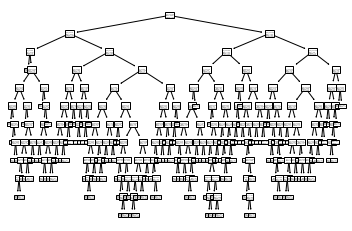

In [112]:
from sklearn.tree import plot_tree
plot_tree(dtr)

Second model using 80% of the dataset as training set

In [51]:
#2. Now dividing dataset into train and test sets 
from sklearn.model_selection import train_test_split
xtrain, xtest, ytrain, ytest = train_test_split(x,y, test_size = 0.2, random_state = 2) # shuffling the dataset 2 times and splitting in 80-20 ratio
xtrain.shape

(316, 58)

In [52]:
xtest.shape

(79, 58)

1. Linear Regression

In [53]:
lr1 = LinearRegression()
lr1.fit(xtrain,ytrain)

LinearRegression()

In [54]:
lr1.coef_

array([-0.32159087,  0.32159087, -0.04696982,  0.04696982, -0.0281252 ,
        0.0281252 , -0.04949646,  0.04949646, -0.0188479 ,  0.0188479 ,
        0.03167391, -0.14352144,  0.0889256 ,  0.09279054, -0.06986861,
        0.04465488,  0.43629763,  0.05952414, -0.38993279, -0.15054385,
        0.02783153, -0.17203064,  0.19979343, -0.05559432,  0.14219764,
        0.25890566, -0.4011033 , -0.23848734,  0.23848734, -0.02285181,
        0.02285181, -0.04747789,  0.04747789,  0.14875205, -0.14875205,
        0.26959188, -0.26959188, -0.08279548,  0.08279548, -0.01139274,
        0.01139274,  0.11898456, -0.11898456, -0.21094066,  0.14830939,
       -0.02777846,  0.16902719, -0.10266335,  0.21048455,  0.30912759,
        0.1000995 , -0.00109937, -0.1581296 ,  0.14606741,  0.08262948,
        0.04309246,  0.21815063,  0.95712588])

In [55]:
lr1.intercept_

-0.9885414749741699

In [56]:
pred1 = lr1.predict(xtest)
print("MAE: ", mean_absolute_error(ytest,pred1))
print("MSE: ",mean_squared_error(ytest,pred1))
print("RMSE: ",np.sqrt(mean_squared_error(ytest,pred1)))
print("R2 Score: ",r2_score(ytest,pred1))

MAE:  1.3507786328203053
MSE:  3.295476426119725
RMSE:  1.8153447127528493
R2 Score:  0.8274777427532571


In [57]:
print("RMSE of training set: ",np.sqrt(mean_squared_error(ytrain,lr1.predict(xtrain))))

RMSE of training set:  1.834178898695925


In [58]:
arr = ytest.to_numpy()
arr

array([14, 16, 17, 14, 11,  8,  6,  8, 10, 13, 11, 11,  8,  9, 11, 12, 10,
       14, 12, 10, 14,  8, 10, 10, 15, 16, 15,  0, 10, 15, 10, 13,  8, 13,
        6, 11,  0, 11, 11, 11, 18, 10,  5,  9,  9,  8,  9,  8, 16,  0,  0,
       10, 10, 13,  0,  8, 11,  0, 10, 12, 18, 10, 13, 15,  0, 12, 10,  8,
       16,  9, 10, 18, 12, 13, 17, 11,  6, 15, 11], dtype=int64)

C:\Users\RITIKA SARKAR\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


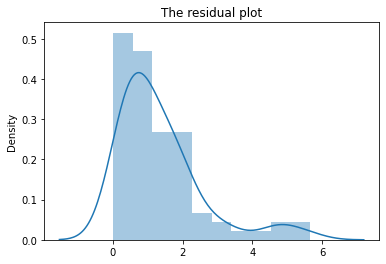

In [59]:

resid = [abs(arr[i]-pred1[i]) for i in range(len(ytest))]
sns.distplot(resid)
plt.title("The residual plot")
plt.show()


2. Single Layer Perceptron

In [60]:
slp1 = Perceptron()
slp1.fit(xtrain,ytrain)

Perceptron()

In [61]:
slp1.coef_

array([[  14.,  -13.,   -6., ..., -168.,  -31., -101.],
       [   0.,    0.,    5., ...,  -13.,  -42.,  -50.],
       [ -11.,   14.,   11., ...,   13., -105.,  -33.],
       ...,
       [  -1.,   -7.,    6., ...,    5.,   61.,   89.],
       [ -11.,    4.,    0., ...,   -3.,   65.,   87.],
       [  -1.,   -1.,   -6., ...,  -20.,   12.,   14.]])

In [62]:
slp1.intercept_

array([ 1.,  0.,  3.,  4.,  1., -1., -4.,  6.,  0., -3., -5., -6., -3.,
       -9., -6., -8., -7., -2.])

In [63]:
spred1 = slp1.predict(xtest)
print("MAE: ", mean_absolute_error(ytest,spred1))
print("MSE: ",mean_squared_error(ytest,spred1))
print("RMSE: ",np.sqrt(mean_squared_error(ytest,spred1)))
print("R2 Score: ",r2_score(ytest,spred1))

MAE:  2.2911392405063293
MSE:  8.670886075949367
RMSE:  2.9446368326076082
R2 Score:  0.5460684147834984


In [64]:
print("RMSE of training set: ",np.sqrt(mean_squared_error(ytrain,slp1.predict(xtrain))))

RMSE of training set:  2.3660306984109027


C:\Users\RITIKA SARKAR\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


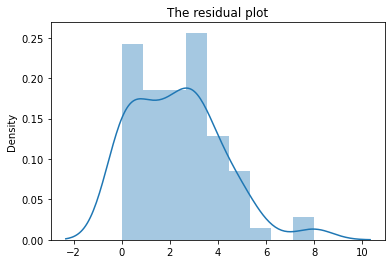

In [65]:
arr = ytest.to_numpy()
resid = [abs(arr[i]-spred1[i]) for i in range(len(ytest))]
sns.distplot(resid)
plt.title("The residual plot")
plt.show()

3. Decision Tree Regressor

In [66]:
from sklearn.tree import DecisionTreeRegressor
dtr1 = DecisionTreeRegressor()
dtr1.fit(xtrain,ytrain)

DecisionTreeRegressor()

In [67]:
dpred1 = dtr1.predict(xtest)
print("MAE: ", mean_absolute_error(ytest,dpred1))
print("MSE: ",mean_squared_error(ytest,dpred1))
print("RMSE: ",np.sqrt(mean_squared_error(ytest,dpred1)))
print("R2 Score: ",r2_score(ytest,dpred1))

MAE:  1.3670886075949367
MSE:  5.7215189873417724
RMSE:  2.3919696877974377
R2 Score:  0.7004714211418122


In [68]:
print("RMSE of training set: ",np.sqrt(mean_squared_error(ytrain,dtr1.predict(xtrain)))) # overfitted

RMSE of training set:  0.0


C:\Users\RITIKA SARKAR\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


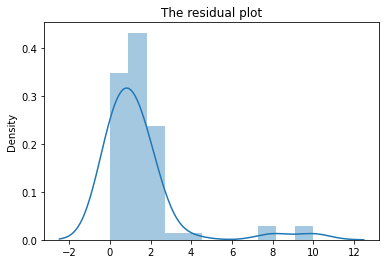

In [69]:
arr = ytest.to_numpy()
resid = [abs(arr[i]-dpred1[i]) for i in range(len(ytest))]
sns.distplot(resid)
plt.title("The residual plot")
plt.show()

Third model using 75% of the dataset as training set

In [70]:
xtrain1, xtest1, ytrain1, ytest1 = train_test_split(x,y, test_size = 0.25, random_state = 2) # shuffling the dataset 2 times and splitting in 75-25 ratio
xtrain1.shape

(296, 58)

In [71]:
xtest1.shape

(99, 58)

1. Linear Regression

In [72]:
lr2 = LinearRegression()
lr2.fit(xtrain1,ytrain1)

LinearRegression()

In [73]:
lr2.coef_

array([-0.36910701,  0.36910701, -0.03082677,  0.03082677, -0.03211595,
        0.03211595, -0.07850093,  0.07850093, -0.04519363,  0.04519363,
        0.03553889, -0.22185236,  0.08781359,  0.12825876, -0.02975889,
        0.08397189,  0.44100206,  0.08577125, -0.44119654, -0.16954866,
        0.02677023, -0.15227583,  0.22203079, -0.09652519,  0.20314597,
        0.29485536, -0.49800134, -0.26253021,  0.26253021, -0.01568603,
        0.01568603, -0.0163633 ,  0.0163633 ,  0.15069721, -0.15069721,
        0.24949907, -0.24949907, -0.03847552,  0.03847552,  0.02070781,
       -0.02070781,  0.14394156, -0.14394156, -0.20365503,  0.16058517,
        0.01435997,  0.16714845, -0.12323733,  0.27278021,  0.32478332,
        0.10782969, -0.01602146, -0.19679654,  0.17233406,  0.07068564,
        0.0436618 ,  0.21808805,  0.96617562])

In [74]:
lr2.intercept_

-1.3254840601004023

In [75]:
pred2 = lr2.predict(xtest1)
print("MAE: ", mean_absolute_error(ytest1,pred2))
print("MSE: ",mean_squared_error(ytest1,pred2))
print("RMSE: ",np.sqrt(mean_squared_error(ytest1,pred2)))
print("R2 Score: ",r2_score(ytest1,pred2))

MAE:  1.3060363891868965
MSE:  3.0321397844306217
RMSE:  1.7413040470953434
R2 Score:  0.827931202436428


In [76]:
print("RMSE of training set: ",np.sqrt(mean_squared_error(ytrain1,lr2.predict(xtrain1))))

RMSE of training set:  1.8769914895893538


C:\Users\RITIKA SARKAR\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


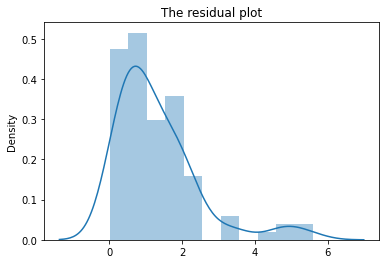

In [77]:
arr = ytest1.to_numpy()
resid = [abs(arr[i]-pred2[i]) for i in range(len(ytest1))]
sns.distplot(resid)
plt.title("The residual plot")
plt.show()

2. Single Layer Perceptron

In [78]:
slp2 = Perceptron()
slp2.fit(xtrain1,ytrain1)

Perceptron()

In [79]:
slp2.coef_

array([[  12.,  -11.,   -4., ..., -150.,  -37.,  -93.],
       [   0.,    0.,    2., ...,    2.,  -35.,  -27.],
       [  -7.,    9.,    0., ...,  -18.,  -64.,  -32.],
       ...,
       [  -2.,   -6.,    0., ...,   -3.,   51.,   86.],
       [ -14.,    7.,   -3., ...,  -10.,   55.,   71.],
       [  -3.,    0.,   -5., ...,  -20.,   24.,   16.]])

In [80]:
slp2.intercept_

array([ 1.,  0.,  2.,  7.,  0., -2., -6.,  4., -2., -1., -3., -6., -6.,
       -8., -6., -8., -7., -3.])

In [81]:
spred2 = slp2.predict(xtest1)
print("MAE: ", mean_absolute_error(ytest1,spred2))
print("MSE: ",mean_squared_error(ytest1,spred2))
print("RMSE: ",np.sqrt(mean_squared_error(ytest1,spred2)))
print("R2 Score: ",r2_score(ytest1,spred2)) # the model prediction is random and is the worst

MAE:  2.303030303030303
MSE:  8.747474747474747
RMSE:  2.9576130151652276
R2 Score:  0.5035956227201668


In [82]:
print("RMSE of training set: ",np.sqrt(mean_squared_error(ytrain1,slp2.predict(xtrain1))))

RMSE of training set:  2.565361783663482


C:\Users\RITIKA SARKAR\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


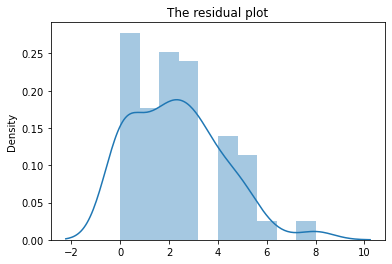

In [83]:
arr = ytest1.to_numpy()
resid = [abs(arr[i]-spred2[i]) for i in range(len(ytest1))]
sns.distplot(resid)
plt.title("The residual plot")
plt.show()

3. Decision Tree Regressor

In [84]:
from sklearn.tree import DecisionTreeRegressor
dtr2 = DecisionTreeRegressor()
dtr2.fit(xtrain1,ytrain1)

DecisionTreeRegressor()

In [85]:
dpred2 = dtr2.predict(xtest1)
print("MAE: ", mean_absolute_error(ytest1,dpred2))
print("MSE: ",mean_squared_error(ytest1,dpred2))
print("RMSE: ",np.sqrt(mean_squared_error(ytest1,dpred2)))
print("R2 Score: ",r2_score(ytest1,dpred2))

MAE:  1.1313131313131313
MSE:  4.0606060606060606
RMSE:  2.0150945537631877
R2 Score:  0.769567483064096


In [86]:
print("RMSE of training set: ",np.sqrt(mean_squared_error(ytrain1,dtr2.predict(xtrain1)))) # again overfitted

RMSE of training set:  0.0


C:\Users\RITIKA SARKAR\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


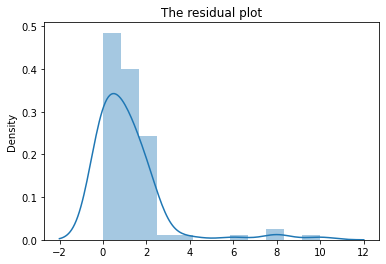

In [87]:
arr = ytest1.to_numpy()
resid = [abs(arr[i]-dpred2[i]) for i in range(len(ytest1))]
sns.distplot(resid)
plt.title("The residual plot")
plt.show()

Fourth model using 70% of the dataset as training set

In [88]:
xtrain2, xtest2, ytrain2, ytest2 = train_test_split(x,y, test_size = 0.3, random_state = 2) # shuffling the dataset 2 times and splitting in 70-30 ratio
xtrain2.shape

(276, 58)

In [89]:
xtest2.shape

(119, 58)

1. Linear Regression

In [90]:
lr3 = LinearRegression()
lr3.fit(xtrain2,ytrain2)

LinearRegression()

In [91]:
lr3.coef_

array([-0.32957588,  0.32957588,  0.00550284, -0.00550284, -0.02298737,
        0.02298737, -0.12821054,  0.12821054, -0.02135942,  0.02135942,
       -0.1772656 , -0.12955304,  0.03518454,  0.27661512, -0.00498102,
        0.0885964 ,  0.30608199,  0.09602649, -0.37557973, -0.11512514,
        0.01493677, -0.07669538,  0.11157038, -0.04981177,  0.10303298,
        0.27175099, -0.37478398, -0.27261421,  0.27261421,  0.02337909,
       -0.02337909, -0.01469905,  0.01469905,  0.12763692, -0.12763692,
        0.33185287, -0.33185287, -0.04907119,  0.04907119,  0.09631331,
       -0.09631331,  0.13543129, -0.13543129, -0.17181968,  0.09131476,
        0.0441308 ,  0.12677534, -0.15500715,  0.25335117,  0.3036603 ,
        0.06850813,  0.02771705, -0.15954312,  0.10393968,  0.10411457,
        0.04721918,  0.20556823,  0.97102551])

In [92]:
lr3.intercept_

-1.3473435989849616

In [93]:
pred3 = lr3.predict(xtest2)
print("MAE: ", mean_absolute_error(ytest2,pred3))
print("MSE: ",mean_squared_error(ytest2,pred3))
print("RMSE: ",np.sqrt(mean_squared_error(ytest2,pred3)))
print("R2 Score: ",r2_score(ytest2,pred3))

MAE:  1.2989275450049786
MSE:  3.1982752860108508
RMSE:  1.788372244811144
R2 Score:  0.8239411916702961


In [94]:
print("RMSE of training set: ",np.sqrt(mean_squared_error(ytrain2,lr3.predict(xtrain2))))

RMSE of training set:  1.8789595751106716


C:\Users\RITIKA SARKAR\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


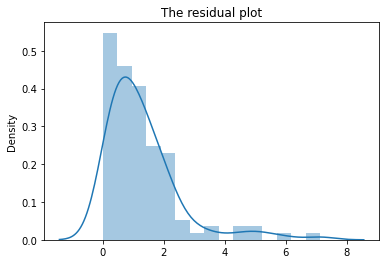

In [95]:
arr = ytest2.to_numpy()
resid = [abs(arr[i]-pred3[i]) for i in range(len(ytest2))]
sns.distplot(resid)
plt.title("The residual plot")
plt.show()

2. Single Layer Perceptron

In [96]:
slp3 = Perceptron()
slp3.fit(xtrain2,ytrain2)

Perceptron()

In [97]:
slp3.coef_

array([[  14.,  -14.,   -8., ..., -176.,  -34., -113.],
       [   0.,    0.,    4., ...,    5.,  -30.,  -25.],
       [  -6.,    7.,    1., ...,   14.,  -63.,  -29.],
       ...,
       [  -1.,   -9.,    2., ...,    8.,   59.,   93.],
       [ -12.,    6.,   -3., ...,  -37.,   47.,   59.],
       [  -2.,   -1.,   -7., ...,   -5.,   30.,   23.]])

In [98]:
slp3.intercept_

array([  0.,   0.,   1.,   5.,   1.,   0.,  -9.,  11.,  -2.,   2.,  -4.,
        -4.,  -4.,  -4.,  -6., -10.,  -6.,  -3.])

In [99]:
spred3 = slp3.predict(xtest2)
print("MAE: ", mean_absolute_error(ytest2,spred3))
print("MSE: ",mean_squared_error(ytest2,spred3))
print("RMSE: ",np.sqrt(mean_squared_error(ytest2,spred3)))
print("R2 Score: ",r2_score(ytest2,spred3))

MAE:  2.2100840336134455
MSE:  9.420168067226891
RMSE:  3.0692292301532142
R2 Score:  0.48143814529170303


In [100]:
print("RMSE of training set: ",np.sqrt(mean_squared_error(ytrain2,slp3.predict(xtrain2))))

RMSE of training set:  2.9903225554289703


C:\Users\RITIKA SARKAR\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


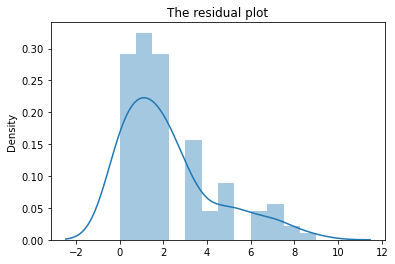

In [101]:
arr = ytest2.to_numpy()
resid = [abs(arr[i]-spred3[i]) for i in range(len(ytest2))]
sns.distplot(resid)
plt.title("The residual plot")
plt.show()

3. Decision Tree Regressor

In [102]:
from sklearn.tree import DecisionTreeRegressor
dtr3 = DecisionTreeRegressor()
dtr3.fit(xtrain2,ytrain2)

DecisionTreeRegressor()

In [103]:
dpred3 = dtr3.predict(xtest2)
print("MAE: ", mean_absolute_error(ytest2,dpred3))
print("MSE: ",mean_squared_error(ytest2,dpred3))
print("RMSE: ",np.sqrt(mean_squared_error(ytest2,dpred3)))
print("R2 Score: ",r2_score(ytest2,dpred3))

MAE:  1.2773109243697478
MSE:  5.361344537815126
RMSE:  2.3154577382917454
R2 Score:  0.7048684537877845


In [104]:
print("RMSE of training set: ",np.sqrt(mean_squared_error(ytrain2,dtr3.predict(xtrain2)))) # overfitted as usual

RMSE of training set:  0.0


C:\Users\RITIKA SARKAR\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


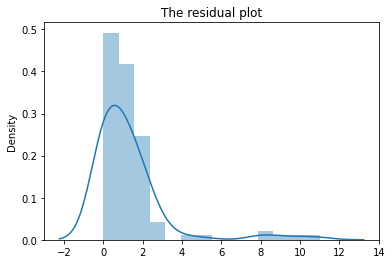

In [105]:
arr = ytest2.to_numpy()
resid = [abs(arr[i]-dpred3[i]) for i in range(len(ytest2))]
sns.distplot(resid)
plt.title("The residual plot")
plt.show()

# Conclusions 
- We conclude that linear regression models the dataset the best because it gives a consistent r2 score of around 0.82 or 0.83 which is a good score and means the model can cover the variations in the data to a good extent. The residual plot of linear regression is skewed to the left, which means, the low errors have the maximum frequency, i.e. our model predicts with a good accuracy.
- The single layer perceptron model doesn't perform as well as linear regression. We can improve the accuracy by tuning the hyperparameters like n_iters, n_iter_no_change. It gives a low r2 score because of insufficient iterations or the generated weights weren't correct or the with the default number of iterations the model got overfitted. But the model had good amount of low errors, so some of the predictions were correct.
- The decision tree model was overfitted on the training set all the 4 times we trained it on different splits of the data. So it gave a lower r2 score than expected, as it couldn't model the new variations well. Also, the residual plot showed that there were some outliers on the extreme right, which means the error was high on them, hence supporting the above statement.
- Hence, the final conclusion is that linear regression model is the most suitable model among all the models compared.